In [3]:
import os
import torch
import torch.nn.functional as F
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from models.unet import UNet

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
CLASS_MAPPING = {
    0: ('Background Clutter', (0, 0, 0)),
    1: ('Low Vegetation', (128, 128, 0)),
    2: ('Road', (128, 64, 128)),
    3: ('Building', (128, 0, 0)),
    4: ('Human', (64, 64, 0)),
    5: ('Moving Car', (64, 0, 128)),
    6: ('Tree', (0, 128, 0)),
    7: ('Static Car', (192, 0, 192))
}

In [5]:
checkpoint_dir = None

checkpoint_files = [f for f in os.listdir(checkpoint_dir) if f.startswith('checkpoint_')]
if checkpoint_files:
    latest_checkpoint = sorted(checkpoint_files)[-1]
    checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint, "checkpoint.pth")
else:
    checkpoint_path = os.path.join(checkpoint_dir, "checkpoint.pth")

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_unet = UNet(8)
model_unet.load_state_dict(torch.load(checkpoint_path, map_location=device))
model_unet.to(device)
model_unet.eval()

print(model_unet)

UNet(
  (down1): Downsample(
    (down): DoubleConvolution(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
      (dropout): Dropout2d(p=0.0, inplace=False)
    )
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): Downsample(
    (down): DoubleConvolution(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), pa

In [7]:
IMG_PATHS = []

## GradCAM

In [8]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_full_backward_hook(backward_hook)

    def generate(self, input_tensor, target_class=None):
        self.model.zero_grad()
        output = self.model(input_tensor)
        
        if target_class is not None:
            one_hot = torch.zeros_like(output)
            one_hot[:, target_class, :, :] = 1
            output.backward(gradient=one_hot, retain_graph=True)
        else:
            output.max(dim=1)[0].sum().backward()
        
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=input_tensor.shape[2:], mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        
        return cam, output.detach()


def get_color_mask(pred_mask):
    h, w = pred_mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for class_id, (name, color) in CLASS_MAPPING.items():
        color_mask[pred_mask == class_id] = color
    return color_mask


def visualize_gradcam(image, cam, pred, alpha=0.5):
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    
    img_np = image.squeeze().permute(1, 2, 0).cpu().numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    
    axes[0].imshow(img_np)
    axes[0].set_title('Input Image')
    axes[0].axis('off')
    
    axes[1].imshow(cam, cmap='jet')
    axes[1].set_title('Grad-CAM')
    axes[1].axis('off')
    
    axes[2].imshow(img_np)
    axes[2].imshow(cam, cmap='jet', alpha=alpha)
    axes[2].set_title('Overlay')
    axes[2].axis('off')
    
    pred_mask = pred.argmax(dim=1).squeeze().cpu().numpy()
    color_mask = get_color_mask(pred_mask)
    axes[3].imshow(color_mask)
    axes[3].set_title('Prediction')
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()

In [9]:
transform = A.Compose([
    A.Resize(540, 960),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
])

In [10]:
def process_single_image(img_path, model, target_layer, target_class=0):
    image = np.array(Image.open(img_path).convert('RGB'))
    transformed = transform(image=image)
    input_tensor = transformed['image'].unsqueeze(0).to(device)

    gradcam = GradCAM(model_unet, target_layer)

    with torch.enable_grad():
        model_unet.train()
        cam, output = gradcam.generate(input_tensor, target_class=target_class)
        model_unet.eval()
    
    return input_tensor, cam, output


def visualize_batch(img_paths, model, target_layer, target_class=0):
    n = len(img_paths)
    fig, axes = plt.subplots(n, 4, figsize=(16, 4 * n))
    if n == 1:
        axes = axes.reshape(1, -1)
    
    class_name = CLASS_MAPPING[target_class][0]
    
    for i, img_path in enumerate(img_paths):
        input_tensor, cam, output = process_single_image(img_path, model, target_layer, target_class)
        
        img_np = input_tensor.squeeze().permute(1, 2, 0).cpu().numpy()
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
        
        axes[i, 0].imshow(img_np)
        axes[i, 0].set_title(f'Input: {img_path.split("/")[-1]}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(cam, cmap='jet')
        axes[i, 1].set_title(f'Grad-CAM ({class_name})')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(img_np)
        axes[i, 2].imshow(cam, cmap='jet', alpha=0.5)
        axes[i, 2].set_title('Overlay')
        axes[i, 2].axis('off')
        
        pred_mask = output.argmax(dim=1).squeeze().cpu().numpy()
        color_mask = get_color_mask(pred_mask)
        axes[i, 3].imshow(color_mask)
        axes[i, 3].set_title('Prediction')
        axes[i, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

In [11]:
MODEL = model_unet

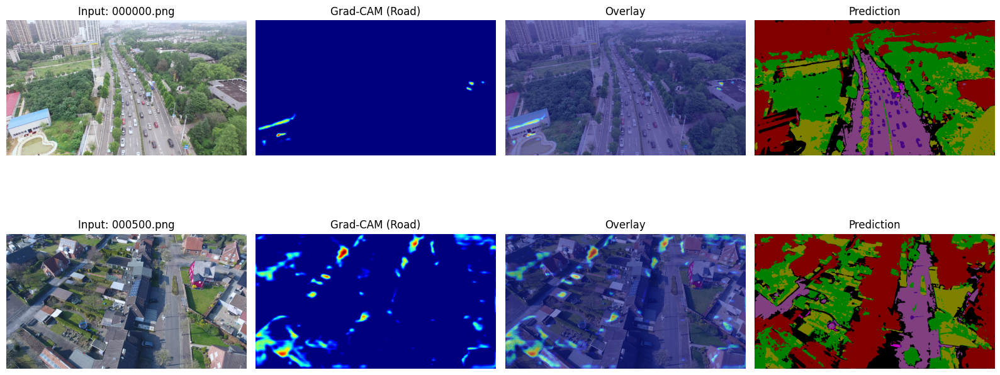

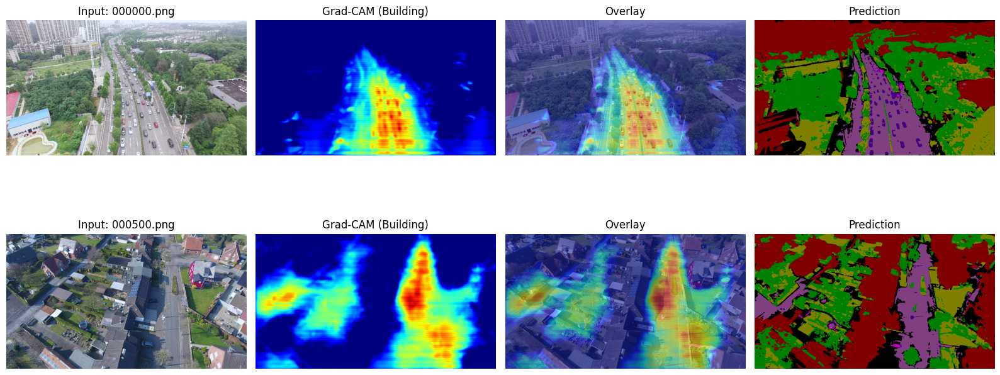

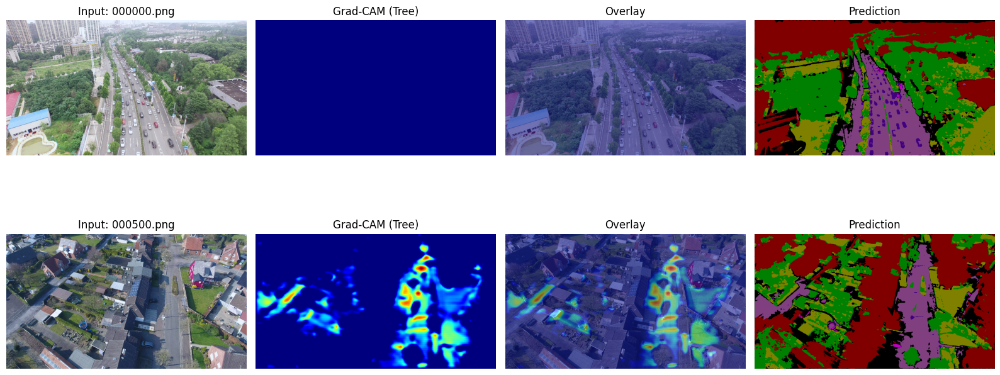

In [12]:
TARGET_LAYER = model_unet.up2

visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=2) # Road
visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=3) # Building
visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=6) # Tree

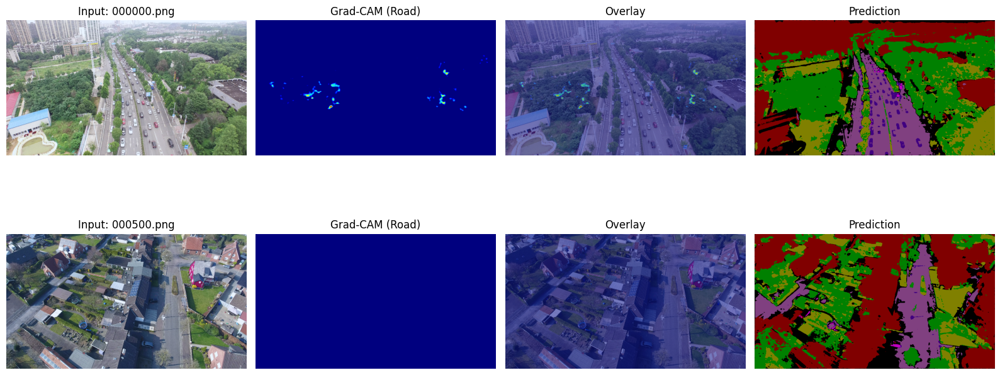

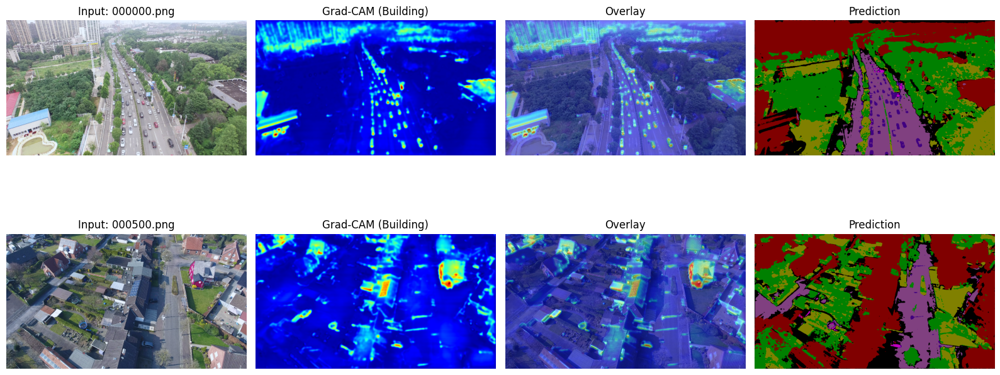

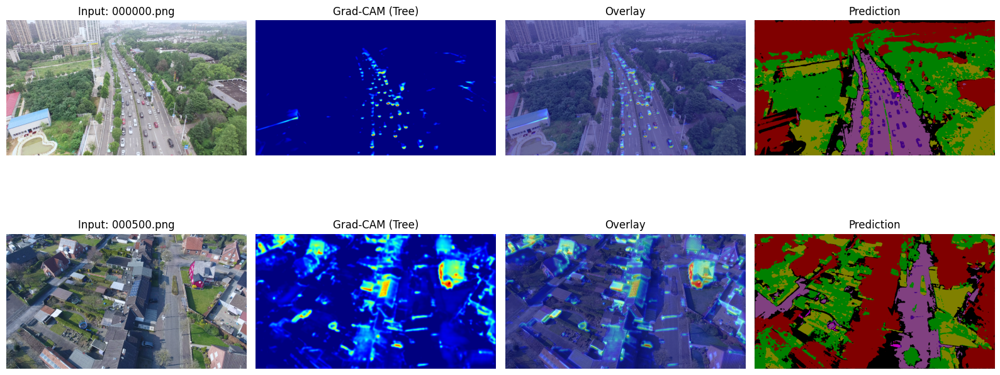

In [13]:
TARGET_LAYER = model_unet.up3

visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=2) # Road
visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=3) # Building
visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=6) # Tree

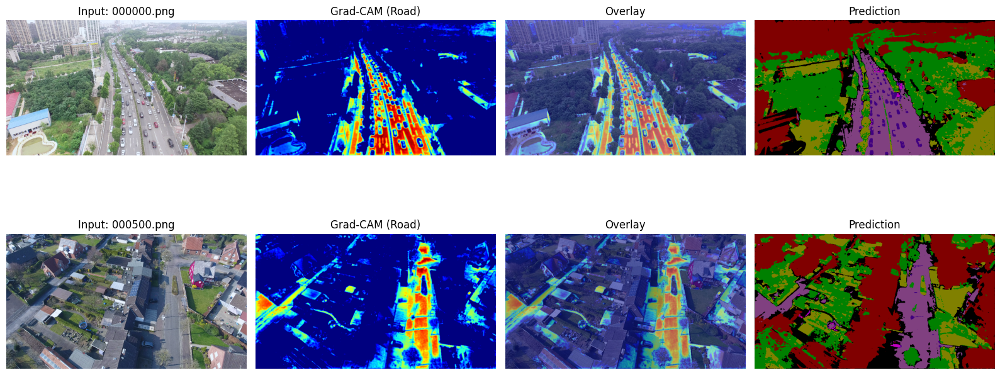

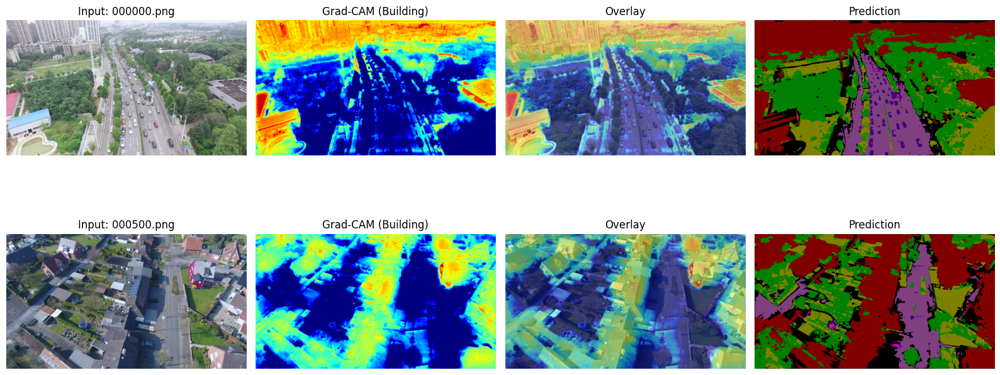

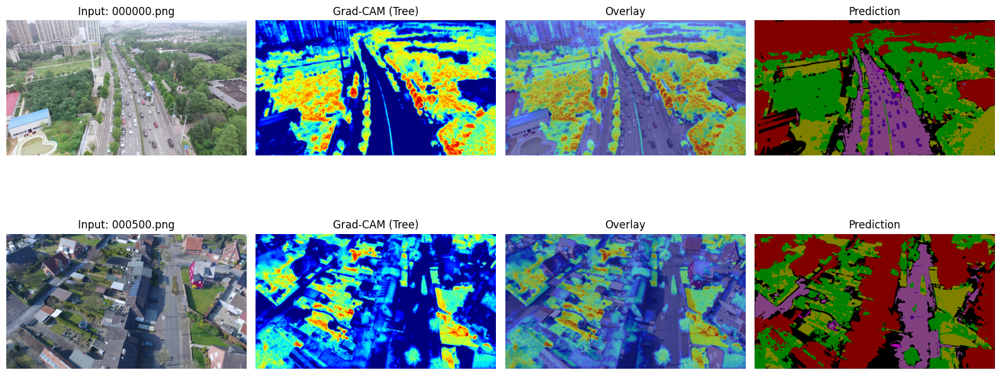

In [14]:
TARGET_LAYER = model_unet.up4

visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=2) # Road
visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=3) # Building
visualize_batch(IMG_PATHS, MODEL, TARGET_LAYER, target_class=6) # Tree

Here we see how the different U-Net blocks are explained using Grad CAM. The last block is easy to define when the deeper ones are capturing different patterns that are more difficult to understand, cause they start to highlight other classes, so the final inference can't be fully explained using them

## Vanilla Gradients

In [15]:
class VanillaGradients:
    def __init__(self, model):
        self.model = model
    
    def generate(self, input_tensor, target_class=None):
        input_tensor.requires_grad = True
        self.model.zero_grad()
        
        output = self.model(input_tensor)
        
        if target_class is not None:
            one_hot = torch.zeros_like(output)
            one_hot[:, target_class, :, :] = 1
            output.backward(gradient=one_hot, retain_graph=True)
        else:
            output.max(dim=1)[0].sum().backward()
        
        gradients = input_tensor.grad.detach().cpu().numpy()
        
        return gradients, output.detach()
    
    @staticmethod
    def process_gradients(gradients, method='absolute'):
        if method == 'absolute':
            grad_map = np.abs(gradients).sum(axis=1)
        elif method == 'positive':
            grad_map = np.maximum(gradients, 0).sum(axis=1)
        elif method == 'negative':
            grad_map = np.abs(np.minimum(gradients, 0)).sum(axis=1)
        elif method == 'raw':
            grad_map = gradients.sum(axis=1)
        else:
            raise ValueError(f"Unknown method: {method}")
        
        grad_map = grad_map.squeeze()
        
        grad_map = (grad_map - grad_map.min()) / (grad_map.max() - grad_map.min() + 1e-8)
        
        return grad_map

In [16]:
def visualize_vanilla_gradients(image, gradients, pred, target_class, alpha=0.5):
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    img_np = image.squeeze().permute(1, 2, 0).cpu().detach().numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    
    pred_mask = pred.argmax(dim=1).squeeze().cpu().detach().numpy()
    color_mask = get_color_mask(pred_mask)
    
    methods = ['absolute']
    grad_maps = {method: VanillaGradients.process_gradients(gradients, method) 
                 for method in methods}
    
    axes[0].imshow(img_np)
    axes[0].set_title('Input Image', fontsize=12)
    axes[0].axis('off')
    
    grad_map = grad_maps['absolute']
    axes[1].imshow(grad_map, cmap='gray')
    axes[1].set_title(f'Gradients ({CLASS_MAPPING[target_class]})', fontsize=12)
    axes[1].axis('off')
    
    axes[2].imshow(img_np)
    axes[2].imshow(grad_map, cmap='gray', alpha=alpha)
    axes[2].set_title(f'Overlay ({CLASS_MAPPING[target_class]})', fontsize=12)
    axes[2].axis('off')
    
    axes[3].imshow(color_mask)
    axes[3].set_title('Prediction', fontsize=12)
    axes[3].axis('off')
    
    plt.tight_layout()
    plt.show()


def process_image_vanilla(img_path, model, target_class=0):
    image = np.array(Image.open(img_path).convert('RGB'))
    transformed = transform(image=image)
    input_tensor = transformed['image'].unsqueeze(0).to(device)
    
    vanilla_grad = VanillaGradients(model)
    
    with torch.enable_grad():
        model.train()
        gradients, output = vanilla_grad.generate(input_tensor, target_class=target_class)
        model.eval()
    
    return input_tensor, gradients, output


def visualize_batch_vanilla(img_paths, model, target_class=0):
    for img_path in img_paths:
        input_tensor, gradients, output = process_image_vanilla(img_path, model, target_class)
        visualize_vanilla_gradients(input_tensor, gradients, output, target_class)

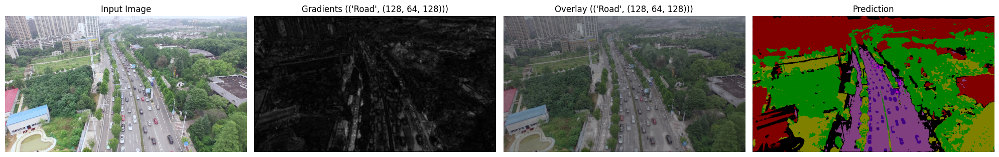

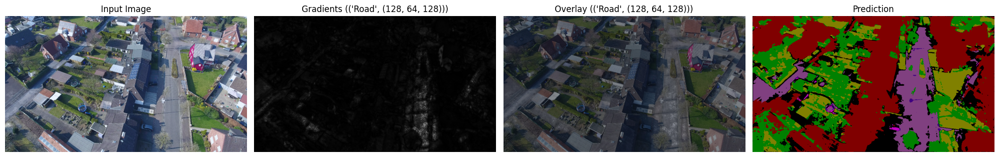

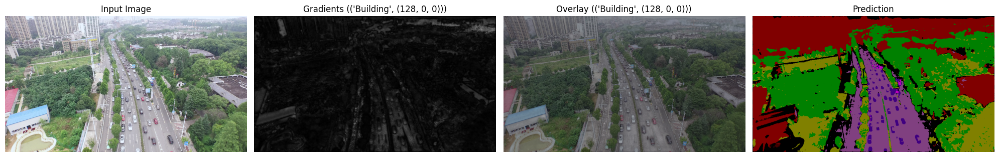

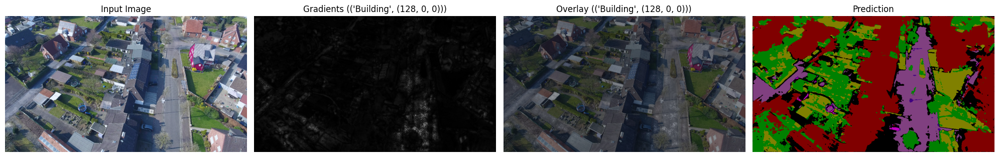

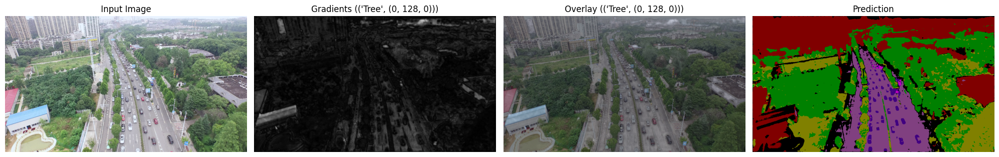

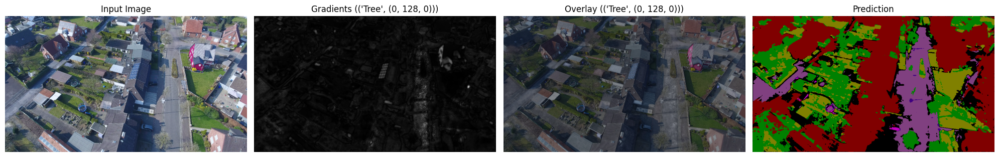

In [17]:
visualize_batch_vanilla(IMG_PATHS, model_unet, target_class=2)  # Road
visualize_batch_vanilla(IMG_PATHS, model_unet, target_class=3)  # Building
visualize_batch_vanilla(IMG_PATHS, model_unet, target_class=6)  # Tree

Vanilla gradients are more difficult to interpret compared to GradCam, as all gradients are similar and it is difficult to find the difference between them, perhaps this method is not suitable for segmentation by multiple labels.